## Getting Pitchfork Data

In [2]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
import tqdm
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string
from collections import defaultdict, Counter
import numpy as np

In [3]:
# Create your connection.
cnx = sqlite3.connect('data.sqlite3')

artist_df = pd.read_sql_query("SELECT * FROM artists", cnx)
artist_review_map_df = pd.read_sql_query("SELECT * FROM artist_review_map", cnx)
author_review_map_df = pd.read_sql_query("SELECT * FROM author_review_map", cnx)
label_review_map_df = pd.read_sql_query("SELECT * FROM label_review_map", cnx)
reviews_df = pd.read_sql_query("SELECT * FROM reviews", cnx)
tombstones_df = pd.read_sql_query("SELECT * FROM tombstones", cnx)
tombstone_release_year_map_df = pd.read_sql_query("SELECT * FROM tombstone_release_year_map", cnx)
genre_review_map_df = pd.read_sql_query("SELECT * FROM genre_review_map", cnx)

In [4]:
# Merge the data together
reviews = pd.merge(artist_df, artist_review_map_df, on = 'artist_id')
reviews = pd.merge(reviews, author_review_map_df, on = 'review_url')
reviews = pd.merge(reviews, label_review_map_df, on = 'review_url')
reviews = pd.merge(reviews, reviews_df, on = 'review_url')
reviews = pd.merge(reviews, tombstones_df, on = 'review_url')
reviews = pd.merge(reviews, tombstone_release_year_map_df, on = 'review_tombstone_id')
reviews = pd.merge(reviews, genre_review_map_df, on = 'review_url')

In [5]:
# Remove any unnecessary columns
reviews = reviews.groupby('review_url', as_index = False).agg({'artist_id': ', '.join, 'name': ', '.join, 
                                                               'author': 'first', 'label': ', '.join, 
                                                               'pub_date': 'first', 'body': 'first', 
                                                              'title': 'first', 'score': 'first',
                                                              'release_year': 'first', 'genre': ', '.join})
reviews = reviews.drop(labels = 'artist_id', axis = 1)
reviews.head()

,review_url,name,author,label,pub_date,body,title,score,release_year,genre
0,/reviews/albums/-wallop/,!!!,Jesse Dorris,Warp,2019-09-07 05:00:00,In Lizzy Goodman's 2017 oral history Meet Me i...,Wallop,7.2,2019,Rock
1,/reviews/albums/-ziq-challenge-me-foolish/,µ-Ziq,Andy Beta,Planet Mu,2018-04-16 05:00:00,"Unlikely as it may seem today, there was a tim...",Challenge Me Foolish,5.8,2018,Electronic
2,/reviews/albums/03-greedo-god-level/,03 Greedo,Torii MacAdams,Alamo,2018-07-05 05:00:00,"As of this June, 03 Greedo is a ward of the Po...",God Level,8.0,2018,Rap
3,/reviews/albums/03-greedo-kenny-beats-netflix-...,"Kenny Beats, 03 Greedo",Sheldon Pearce,"Alamo, Alamo",2019-12-05 06:00:00,"As 03 Greedo's 20-year prison bid continues, s...",Netflix & Deal,7.5,2019,"Rap, Rap"
4,/reviews/albums/03-greedo-ron-rontheproducer-l...,"03 Greedo, Ron-RonTheProducer",Mano Sundaresan,"Alamo, Alamo",2020-08-27 05:00:00,"In a summer declared ""lost"" by partygoers and ...","Load It Up, Vol. 01",7.5,2020,"Rap, Rap"


Reasoning for removing certain parameters/columns:
- `artist_id` and `name`  are joined together because when there are multiple artists working on the same album, the review is duplicated and each artist is listed separately.
- Only the first `authors` is chosen when grouping the data together because I have manually checked that there is no album with two authors listed as working on it.
- `artist_url`, `is_standard_review`, `review_tombston_id`, `picker_index`, `best_new_music`, and `best_new_reissue` are all parameters that we will not use in our analysis so I decided to leave them all out
- `title`, `score`, `release_year`, `pub_date` and `body` are the same for the same review about an album so I just chose the first occurance.
- `label` is joined together because an album can be published by multiple labels
- Finally, at the end, I know that we do not need `artist_id` so I remove that column.

In [6]:
# Removing duplicated labels or genres in each cell of a DataFrame
for i in range(len(reviews)):
    reviews.loc[i, 'label'] = ', '.join([word for word in list(set(reviews.loc[i, 'label'].split(", ")))])
    reviews.loc[i, 'genre'] = ', '.join([word for word in list(set(reviews.loc[i, 'genre'].split(", ")))])

As we are joining the reviews together, I have noticed that some there might be the same `label` or the same `genre` being joined together. I do not want this repeat in the DataFrame, so I remove them using the code above

In [7]:
reviews.head()

,review_url,name,author,label,pub_date,body,title,score,release_year,genre
0,/reviews/albums/-wallop/,!!!,Jesse Dorris,Warp,2019-09-07 05:00:00,In Lizzy Goodman's 2017 oral history Meet Me i...,Wallop,7.2,2019,Rock
1,/reviews/albums/-ziq-challenge-me-foolish/,µ-Ziq,Andy Beta,Planet Mu,2018-04-16 05:00:00,"Unlikely as it may seem today, there was a tim...",Challenge Me Foolish,5.8,2018,Electronic
2,/reviews/albums/03-greedo-god-level/,03 Greedo,Torii MacAdams,Alamo,2018-07-05 05:00:00,"As of this June, 03 Greedo is a ward of the Po...",God Level,8.0,2018,Rap
3,/reviews/albums/03-greedo-kenny-beats-netflix-...,"Kenny Beats, 03 Greedo",Sheldon Pearce,Alamo,2019-12-05 06:00:00,"As 03 Greedo's 20-year prison bid continues, s...",Netflix & Deal,7.5,2019,Rap
4,/reviews/albums/03-greedo-ron-rontheproducer-l...,"03 Greedo, Ron-RonTheProducer",Mano Sundaresan,Alamo,2020-08-27 05:00:00,"In a summer declared ""lost"" by partygoers and ...","Load It Up, Vol. 01",7.5,2020,Rap


In [8]:
reviews_data = reviews.to_csv('reviews_data.csv')

## EDA on Pitchfork data

In [9]:
# Read the data
reviews = pd.read_csv('reviews_data.csv')
reviews.head()

,Unnamed: 0,review_url,name,author,label,pub_date,body,title,score,release_year,genre
0,0,/reviews/albums/-wallop/,!!!,Jesse Dorris,Warp,2019-09-07 05:00:00,In Lizzy Goodman's 2017 oral history Meet Me i...,Wallop,7.2,2019,Rock
1,1,/reviews/albums/-ziq-challenge-me-foolish/,µ-Ziq,Andy Beta,Planet Mu,2018-04-16 05:00:00,"Unlikely as it may seem today, there was a tim...",Challenge Me Foolish,5.8,2018,Electronic
2,2,/reviews/albums/03-greedo-god-level/,03 Greedo,Torii MacAdams,Alamo,2018-07-05 05:00:00,"As of this June, 03 Greedo is a ward of the Po...",God Level,8.0,2018,Rap
3,3,/reviews/albums/03-greedo-kenny-beats-netflix-...,"Kenny Beats, 03 Greedo",Sheldon Pearce,Alamo,2019-12-05 06:00:00,"As 03 Greedo's 20-year prison bid continues, s...",Netflix & Deal,7.5,2019,Rap
4,4,/reviews/albums/03-greedo-ron-rontheproducer-l...,"03 Greedo, Ron-RonTheProducer",Mano Sundaresan,Alamo,2020-08-27 05:00:00,"In a summer declared ""lost"" by partygoers and ...","Load It Up, Vol. 01",7.5,2020,Rap


In [10]:
# Remove the Unnamed:0 column
reviews.drop(labels = 'Unnamed: 0', axis = 1, inplace = True)
reviews.head()

,review_url,name,author,label,pub_date,body,title,score,release_year,genre
0,/reviews/albums/-wallop/,!!!,Jesse Dorris,Warp,2019-09-07 05:00:00,In Lizzy Goodman's 2017 oral history Meet Me i...,Wallop,7.2,2019,Rock
1,/reviews/albums/-ziq-challenge-me-foolish/,µ-Ziq,Andy Beta,Planet Mu,2018-04-16 05:00:00,"Unlikely as it may seem today, there was a tim...",Challenge Me Foolish,5.8,2018,Electronic
2,/reviews/albums/03-greedo-god-level/,03 Greedo,Torii MacAdams,Alamo,2018-07-05 05:00:00,"As of this June, 03 Greedo is a ward of the Po...",God Level,8.0,2018,Rap
3,/reviews/albums/03-greedo-kenny-beats-netflix-...,"Kenny Beats, 03 Greedo",Sheldon Pearce,Alamo,2019-12-05 06:00:00,"As 03 Greedo's 20-year prison bid continues, s...",Netflix & Deal,7.5,2019,Rap
4,/reviews/albums/03-greedo-ron-rontheproducer-l...,"03 Greedo, Ron-RonTheProducer",Mano Sundaresan,Alamo,2020-08-27 05:00:00,"In a summer declared ""lost"" by partygoers and ...","Load It Up, Vol. 01",7.5,2020,Rap


In [11]:
# Looking at the data type of each column
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21400 entries, 0 to 21399
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   review_url    21400 non-null  object 
 1   name          21399 non-null  object 
 2   author        21400 non-null  object 
 3   label         21400 non-null  object 
 4   pub_date      21400 non-null  object 
 5   body          21400 non-null  object 
 6   title         21399 non-null  object 
 7   score         21400 non-null  float64
 8   release_year  21400 non-null  int64  
 9   genre         21400 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 1.6+ MB


In [12]:
# Judging the missing values
reviews_missing_values = reviews.isna().sum()
reviews_missing_values

review_url      0
name            1
author          0
label           0
pub_date        0
body            0
title           1
score           0
release_year    0
genre           0
dtype: int64

In [13]:
# Dropping the row without an artist name
reviews.dropna(subset = ['name', 'title'], inplace=True)

In [14]:
# Double-checking on the missing values
reviews.isna().sum()

review_url      0
name            0
author          0
label           0
pub_date        0
body            0
title           0
score           0
release_year    0
genre           0
dtype: int64

(array([  12.,    9.,   13.,   27.,   60.,   89.,  123.,  196.,  270.,
         422.,  668., 1120., 1759., 2981., 4452., 4781., 2700., 1034.,
         459.,  223.]),
 array([ 0. ,  0.5,  1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ,
         5.5,  6. ,  6.5,  7. ,  7.5,  8. ,  8.5,  9. ,  9.5, 10. ]),
 <BarContainer object of 20 artists>)

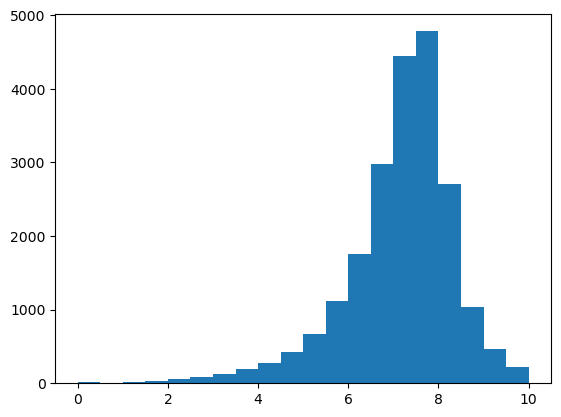

In [15]:
# Looking at the distribution of the pitchfork scores
plt.hist(reviews.loc[:, 'score'], bins = 20)

In [16]:
# Statistical metrics for pitchfork score
reviews.loc[:, 'score'].describe()

count    21398.000000
mean         7.085742
std          1.215410
min          0.000000
25%          6.600000
50%          7.300000
75%          7.800000
max         10.000000
Name: score, dtype: float64

The pitchfork score distribution is a normal distribution that is left skewed. The average score is 7.08 and the median score is 7.30.

(array([   5.,    7.,   22.,   50.,   84.,   75.,   76.,   95.,   52.,
          65.,  109.,  109.,  131.,  841., 2565., 4117., 3089., 2597.,
        3212., 4097.]),
 array([1957. , 1960.2, 1963.4, 1966.6, 1969.8, 1973. , 1976.2, 1979.4,
        1982.6, 1985.8, 1989. , 1992.2, 1995.4, 1998.6, 2001.8, 2005. ,
        2008.2, 2011.4, 2014.6, 2017.8, 2021. ]),
 <BarContainer object of 20 artists>)

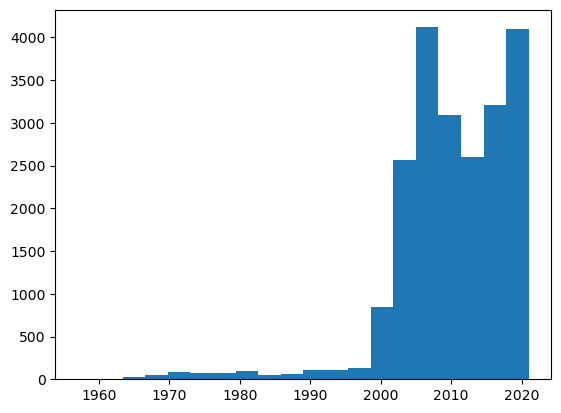

In [17]:
# Looking at the distribution of the pitchfork scores
plt.hist(reviews.loc[:, 'release_year'], bins = 20)

There are a few albums from back in the 70s and 80s, but most of the albums are released after the year 2000. 

## Sentiment Analysis

In [18]:
# Remove all the \n\n
def get_clean_text(row):
    text = reviews.iloc[row, 5]
    text = text.replace('\n\n', ' ')
    text = text.replace('\n', '')
    return text

In [20]:
# Concatenate all the cleaned text into one long string
all_text = ''
for row in tqdm.tqdm(range(reviews.shape[0])):
    cleaned_text = get_clean_text(row)
    artist_name = reviews.iloc[row, 1]
    cleaned_text = cleaned_text.replace(artist_name, '')
    all_text = all_text + ' ' + cleaned_text

100%|█████████████████████████████████████| 21398/21398 [11:19<00:00, 31.51it/s]


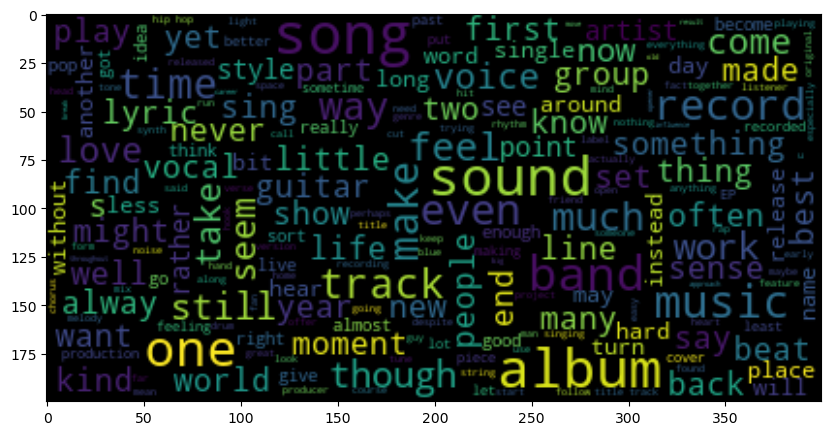

In [21]:
# Word cloud for heroes
wc = WordCloud(max_font_size=30).generate(all_text)
plt.figure(figsize=(10, 10))
plt.imshow(wc, interpolation="bilinear")

In [22]:
# Function to get sentiment scores from Sentiment Analysis
def sentiment_scores(sentence):
 
    # Create a SentimentIntensityAnalyzer object.
    sid_obj = SentimentIntensityAnalyzer()
 
    # polarity_scores method of SentimentIntensityAnalyzer
    # object gives a sentiment dictionary.
    # which contains pos, neg, neu, and compound scores.
    sentiment_dict = sid_obj.polarity_scores(sentence)
     
    return sentiment_dict

In [23]:
# Getting a list of all the negative, neutral and positive reviews
# Creating a dictionary with the review_url as the key and the sentiment scores dictionary as the value
negative = []
neutral = []
positive = []
sent_scores = {}
for row in tqdm.tqdm(range(reviews.shape[0])):
    cleaned_text = get_clean_text(row)
    review_url = reviews.iloc[row, 0]
    sent_scores[review_url] = sentiment_scores(cleaned_text)
    negative.append(sentiment_scores(cleaned_text)['neg'])
    neutral.append(sentiment_scores(cleaned_text)['neu'])
    positive.append(sentiment_scores(cleaned_text)['pos'])

100%|█████████████████████████████████████| 21398/21398 [08:59<00:00, 39.64it/s]


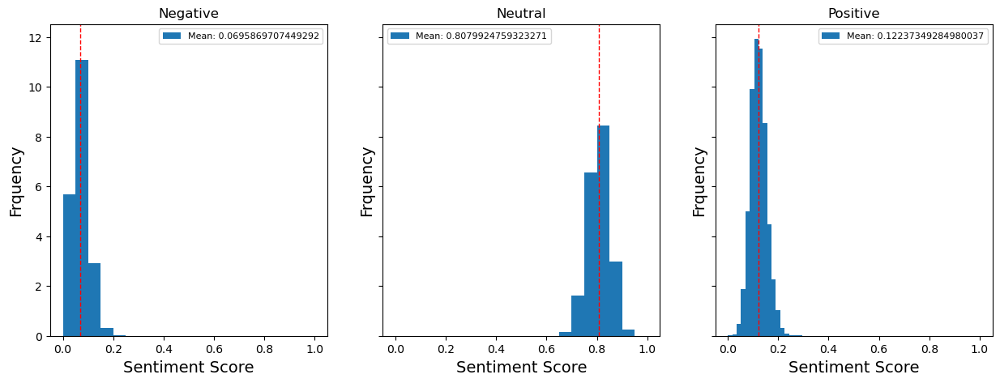

In [24]:
# Plot the distribution of negative, neutral, and positive scores
fig, axes = plt.subplots(ncols=3, figsize=(15,5), sharex = True, sharey = True) 
plt.subplots_adjust(hspace = 0.5)

axes[0].hist(negative, density = True, label = f'Mean: {sum(negative) / len(negative)}', bins = 20)
axes[1].hist(neutral, density = True, label = f'Mean: {sum(neutral) / len(neutral)}', bins = 20)
axes[2].hist(positive, density = True, label = f'Mean: {sum(positive) / len(positive)}', bins = 20)

axes[0].set_xlabel('Sentiment Score', fontsize = 14)
axes[0].set_ylabel('Frquency', fontsize = 14)
axes[0].legend(fontsize = 8)
axes[0].set_title('Negative')
axes[0].axvline(sum(negative) / len(negative), linestyle='dashed', linewidth=1, color = 'red')

axes[1].set_xlabel('Sentiment Score', fontsize = 14)
axes[1].set_ylabel('Frquency', fontsize = 14)
axes[1].legend(fontsize = 8)
axes[1].set_title('Neutral')
axes[1].axvline(sum(neutral) / len(neutral), linestyle='dashed', linewidth=1, color = 'red')

axes[2].set_xlabel('Sentiment Score', fontsize = 14)
axes[2].set_ylabel('Frquency', fontsize = 14)
axes[2].legend(fontsize = 8)
axes[2].set_title('Positive')
axes[2].axvline(sum(positive) / len(positive), linestyle='dashed', linewidth=1, color = 'red')

## Bag of Words Matrix

In [25]:
# Get list of stopwords and add a few
stop_words = set(stopwords.words('english'))

def get_clean_words(text, exclude_words=[]):
    """Given some text, return a list of clean words.
    
    Input
    -----
        text : str
        exclude_words : list
            Words to exclude (e.g. characters own name)
    
    Output
    ------
        words : list
        
    Example
    -------
        >>> my_text = get_clean_text('Iron Man', 'heroes')
        >>> my_words = get_clean_words(my_text, exclude_words=['Iron', 'Man'])
    """

    # Extract words
    words = word_tokenize(text)
    
    # Add exclude words to words to give it same treatment
    words += exclude_words
    
    # Convert to lower case
    words = [w.lower() for w in words]
    
    # Clear punctuation
    table = str.maketrans('', '', string.punctuation)
    words = [w.translate(table) for w in words]
    
    # Seperate words and exclude words
    if len(exclude_words) > 0:
        exclude_words = words[-len(exclude_words):]
        words = words[:-len(exclude_words)]
    
    # Remove non-alphabetic words
    words = [w for w in words if w.isalpha()]
    
    # Remove stop words
    words = [w for w in words if not w in stop_words | set(exclude_words)]
    
    # Remove single letter words 
    words = [w for w in words if len(w) > 1]

    return words

In [26]:
all_text = get_clean_words(all_text)

In [27]:
count = Counter(all_text)
included_word = []
excluded_word = []
for word in count:
    if count[word] <= 10:
        excluded_word.append(word)
    else:
        included_word.append(word)

In [28]:
# Loop through each character in heroes and get clean text

# Dictionary with each album as the key and the value is a dictionary with each word as the key and the number
# of time the word shows up as the value (nested dictionary)
album_word_count = {} 

for row in tqdm.tqdm(range(reviews.shape[0])):
    # Get the cleaned text of the body column of each row
    cleaned_text = get_clean_text(row)
    
    # Get the review_url of each row
    review_url = reviews.iloc[row, 0]
    
    # From the text, get the words of each character
    cleaned_words = get_clean_words(cleaned_text)
        
    # Count the number of characters
    word_count = defaultdict(int) # dictionary with each word as the key and the number of occurence as the value
    
    for word in cleaned_words:
        # Loop through each word in all the text of the body of each row, 
        # if the word shows up more than once among all 
        # the character, add the word into the dictionary and add 1 to the count
        if word in included_word:
            word_count[word] += 1
    
    album_word_count[review_url] = word_count

100%|█████████████████████████████████████| 21398/21398 [10:54<00:00, 32.72it/s]


In [29]:
album_word_count

{'/reviews/albums/-wallop/': defaultdict(int,
             {'lizzy': 1,
              'goodman': 1,
              'oral': 1,
              'history': 1,
              'meet': 1,
              'bathroom': 1,
              'rebirth': 1,
              'rock': 2,
              'roll': 1,
              'new': 4,
              'york': 1,
              'city': 1,
              'nic': 1,
              'offer': 1,
              'spent': 1,
              'century': 1,
              'hosting': 1,
              'party': 2,
              'monsters': 1,
              'across': 1,
              'eight': 1,
              'albums': 1,
              'many': 1,
              'singles': 1,
              'talks': 2,
              'looking': 1,
              'back': 2,
              'decade': 2,
              'pays': 1,
              'sins': 2,
              'last': 1,
              'says': 1,
              'talking': 1,
              'way': 1,
              'grunge': 1,
              'rave': 1,
           

In [30]:
# Alphabetically sort the list of all the words
included_word = sorted(included_word)

# Dictionary with the review_url as the key and a vector where among all the words appearing in every review,
# which word appear in that review specifically
bow_vector = {} 

# For each review_url and dictionary of words of that review 
for review, word_count in tqdm.tqdm(album_word_count.items()):
    
    # Initiate a zero vector that is the length of all the words appearing in every review
    vector = np.zeros(len(included_word))
    
    # For every word of that one review and its frequency
    for word, freq in word_count.items():
        
        # If the word is in the list of words included in the bag of words
        if word in included_word:
            
            # Included_word is a list and index is getting the position of that word within the list
            index = included_word.index(word)
            
            # Using that index, changing that index in the vector to the frequency of the word for that one character
            vector[index] = freq
            
    # Make this vector as the value of the review_url in the dictionary
    bow_vector[review] = vector

100%|█████████████████████████████████████| 21398/21398 [44:13<00:00,  8.07it/s]


In [31]:
len(bow_vector)

21398

In [32]:
# Using the dictionary, make a DataFrame
bow_matrix = pd.DataFrame.from_dict(bow_vector, orient = 'index', columns = included_word)

In [33]:
bow_matrix

,aa,aaa,aacm,aahs,aalegra,aaliyah,aaron,ab,ababa,aback,...,zydeco,zygotic,zz,zé,ágætis,åkerfeldt,élan,ólafur,öyster,øye
/reviews/albums/-wallop/,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
/reviews/albums/-ziq-challenge-me-foolish/,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
/reviews/albums/03-greedo-god-level/,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
/reviews/albums/03-greedo-kenny-beats-netflix-and-deal/,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
/reviews/albums/03-greedo-ron-rontheproducer-load-it-up-vol-01/,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
/reviews/albums/zsela-ache-of-victory-ep/,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
/reviews/albums/zubin-heavy-down-pour-ep/,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
/reviews/albums/zuli-all-caps-ep/,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
/reviews/albums/zuli-terminal/,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Machine Learning Models

model = LinearRegression()
model.fit(X, y)
X is the BOW matrix
y is the dataframe with the score